# EOG
Ch1 -> Up

Ch2 -> Down

Ch3 -> Right

Ch4 -> Left

In [17]:
%matplotlib inline
#%matplotlib notebooks
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.ticker import LinearLocator, FormatStrFormatter
from mpl_toolkits.mplot3d import Axes3D

In [18]:
import mpld3
mpld3.enable_notebook()

In [19]:
import pandas as pd
import numpy as np
import scipy.fftpack

# Define functions

In [164]:
from scipy.signal import iirfilter, lfilter, butter
def notch_filter(time, band, freq, ripple, order, filter_type, data):
    fs   = 1/time
    nyq  = fs/2.0
    low  = freq - band/2.0
    high = freq + band/2.0
    low  = low/nyq
    high = high/nyq
    b, a = iirfilter(order, [low, high], rp=ripple, btype='bandstop',
                     analog=False, ftype=filter_type)
    filtered_data = lfilter(b, a, data)
    return filtered_data

def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a

def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = lfilter(b, a, data)
    return y

def plot_channels(data, title,  xlabel='Time (s)', ylabel='Amplitude (\u03BCV)'):
    plt.figure(figsize=(12, 6))
    channels = [{'channel':'ch1', 'label':'Up'},
                {'channel':'ch2', 'label':'Down'},
                {'channel':'ch3', 'label':'Right'},
                {'channel':'ch4', 'label':'Left'}]
    for channel in channels:
        plt.plot(data['time'], data[channel['channel']], label= channel['channel'] + ': ' + channel['label'])
    
    ax = plt.gca()
    ax.legend()
    plt.title(title)
    plt.ylabel(ylabel)
    plt.xlabel(xlabel)
    plt.show()

def plot_channel_with_marker(data, marker, channel, title,  xlabel='Time (s)', ylabel='Amplitude (\u03BCV)'):
    plt.figure(figsize=(12, 6))
    plt.plot(data['time'], data[channel], label= channel)
    plt.plot(marker['time'], marker[channel], label= 'Marker' + channel)
    
    ax = plt.gca()
    ax.legend()
    plt.title(title)
    plt.ylabel(ylabel)
    plt.xlabel(xlabel)
    plt.show()

def filter_data(title, filepath, starting_point=5, lowcut_freq=0.1, highcut_freq=30, notch=False):
    data = pd.read_csv(filepath,
                   header = 5,
                   names = ['sampleIdx','ch1','ch2','ch3','ch4','accel1','accel2','accel3','timeFormatted','time'])
    # at the moment, timeFormatted is not important and is not well formatted, 
    # as well as sampleIdx and accelerometer data, so we can delete it.
    data = data.drop(["sampleIdx","timeFormatted", "accel1", "accel2", "accel3"],axis=1)

    # reorder dataframe
    data = data[['time', 'ch1', 'ch2', 'ch3', 'ch4']]

    # number of samples
    N = len(data['time']) 

    # sampling frequency (Hz)
    fs = 200.0 

    # sampling period (seconds)
    T = 1.0 / fs 

    startTime = (data['time'].loc[0]).astype(np.float64)
    stopTime = (startTime + N*T)
    time = np.linspace(startTime, stopTime, N)
    time = np.around(time, decimals=3)

    startFromZero = True

    if (startFromZero):
        time = time - round(startTime,3)
        time = np.around(time, decimals=3)
        data['time'] = time
    else:
        data['time'] = time

    #print(data.head())
    
    # select starting point
    data = data[(data['time']>starting_point)]
    
    # Required input defintions are as follows;
    # time:   Time between samples
    # band:   The bandwidth around the centerline freqency that you wish to filter
    # freq:   The centerline frequency to be filtered
    # ripple: The maximum passband ripple that is allowed in db
    # order:  The filter order.  For FIR notch filters this is best set to 2 or 3,
    #         IIR filters are best suited for high values of order.  This algorithm
    #         is hard coded to FIR filters
    # filter_type: 'butter', 'bessel', 'cheby1', 'cheby2', 'ellip'
    # data:         the data to be filtered
    
    channels = ['ch1', 'ch2', 'ch3', 'ch4']
    filtData = pd.DataFrame()
    filtData['time'] = data['time']
    for channel in channels:
        filtData[channel] = butter_bandpass_filter(data = data[channel],
                                                   lowcut = lowcut_freq,
                                                   highcut = highcut_freq,
                                                   fs = fs)
        if notch:
            filtData[channel] = notch_filter(time = T, 
                                             band = 0.1, 
                                             freq = 50.0, 
                                             ripple = 0.5, 
                                             order = 2.0, 
                                             filter_type = 'butter', 
                                             data = filtData[channel])
        
    plot_channels(data=filtData, 
                  title=title)
    
    return filtData


# Down

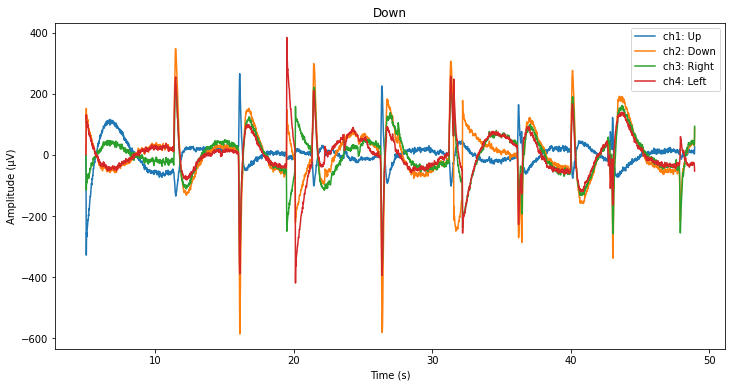

In [158]:
down = filter_data(title='Down',
                   filepath='data/OpenBCISession_eye_movement_test_down/OpenBCI-RAW-2020-03-14_12-24-40.txt')

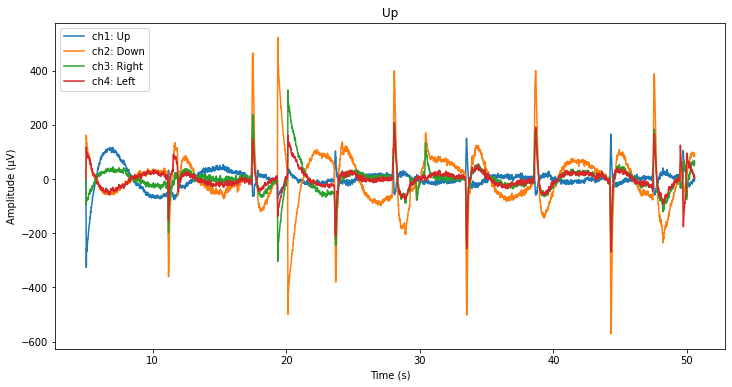

In [159]:
up = filter_data(title='Up',
                   filepath='data/OpenBCISession_eye_movement_test_up/OpenBCI-RAW-2020-03-14_12-22-40.txt')

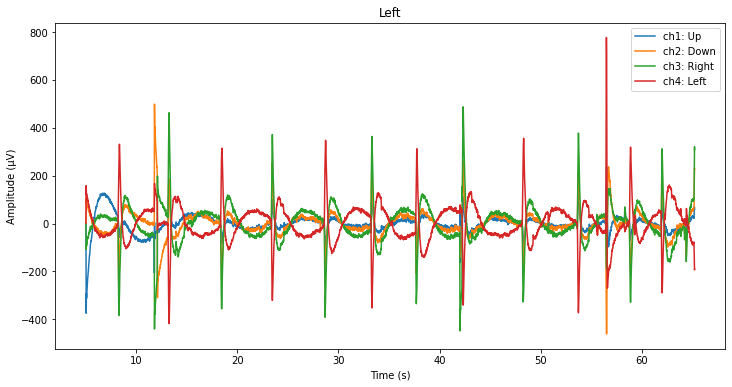

In [160]:
left = filter_data(title='Left',
                   filepath='data/OpenBCISession_eye_movement_test_left/OpenBCI-RAW-2020-03-14_12-00-17.txt')

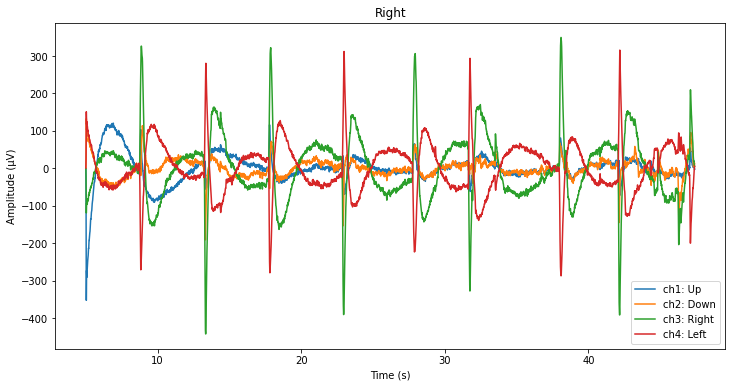

In [161]:
right = filter_data(title='Right',
                   filepath='data/OpenBCISession_eye_movement_test_right/OpenBCI-RAW-2020-03-14_12-15-52.txt')

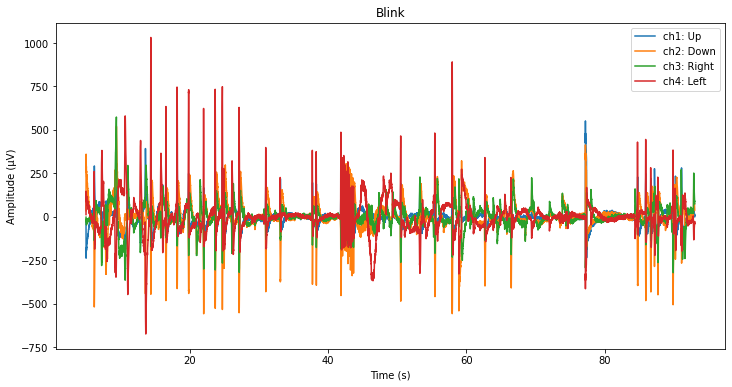

In [162]:
blink = filter_data(title='Blink',
                    filepath='data/OpenBCISession_eye_blink_test/OpenBCI-RAW-2020-03-14_13-02-53.txt',
                    starting_point=5, lowcut_freq=0.1, highcut_freq=60, notch=True)

# Derivative

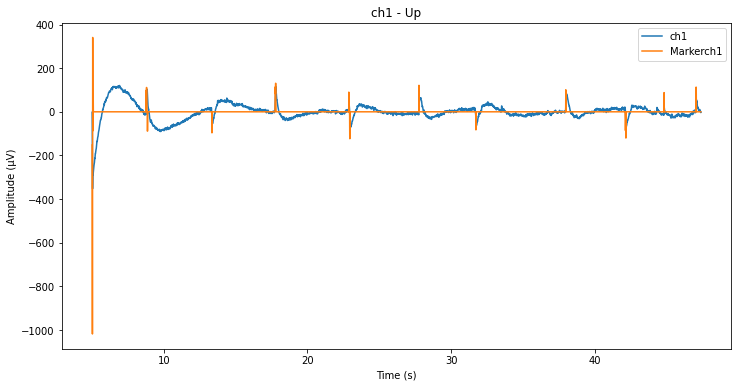

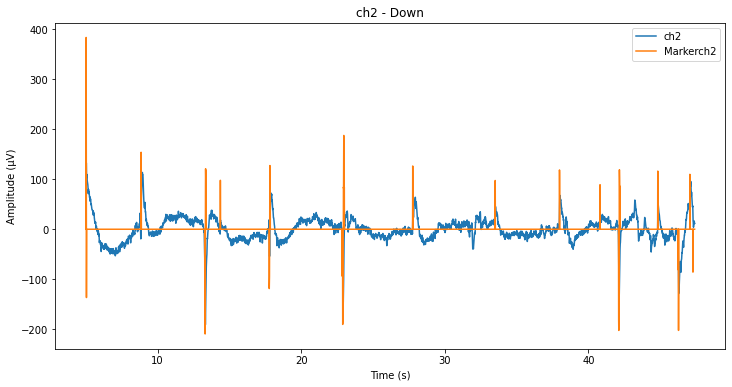

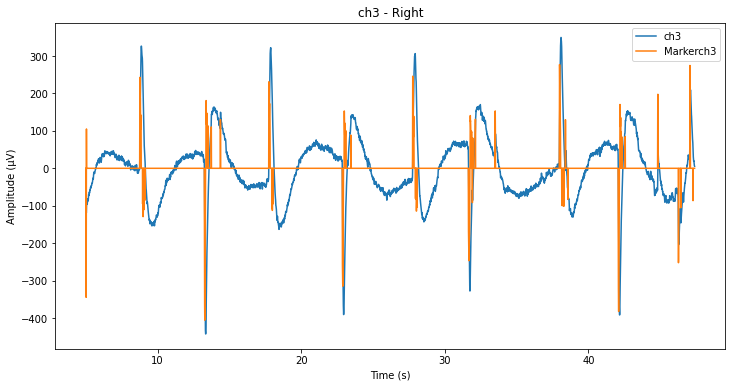

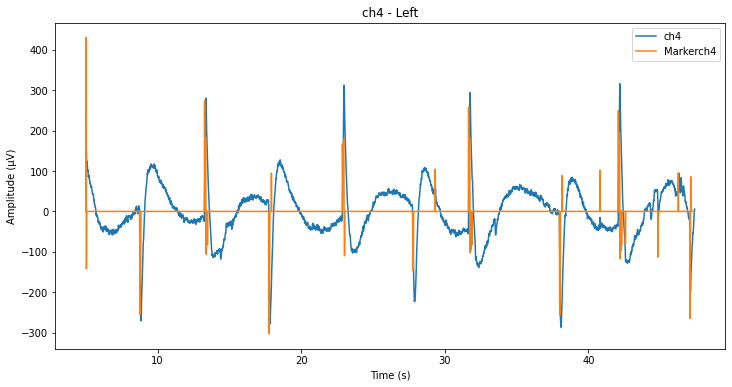

In [172]:
#print(right.head())
right_d = right
right_d = right.diff()
right_d['time'] = right['time']
channels = ['ch1','ch2','ch3','ch4']
right_dz = right_d.copy()
for channel in channels:
    ch = right_dz[channel]
    ch[abs(ch)<8] = 0
    right_dz[channel] = ch * 10

plot_channel_with_marker(data=right, marker=right_dz, channel='ch1', title="ch1 - Up")
plot_channel_with_marker(data=right, marker=right_dz, channel='ch2', title="ch2 - Down")
plot_channel_with_marker(data=right, marker=right_dz, channel='ch3', title="ch3 - Right")
plot_channel_with_marker(data=right, marker=right_dz, channel='ch4', title="ch4 - Left")

# TESTING THINGS

In [14]:
array_ch1_up = pd.array(up["ch1"]).to_numpy()
array_ch2_up = pd.array(up["ch2"]).to_numpy()
array_ch3_up = pd.array(up["ch3"]).to_numpy()
array_ch4_up = pd.array(up["ch4"]).to_numpy()

In [15]:
array_ch1_down = pd.array(down["ch1"]).to_numpy()
array_ch2_down = pd.array(down["ch2"]).to_numpy()
array_ch3_down = pd.array(down["ch3"]).to_numpy()
array_ch4_down = pd.array(down["ch4"]).to_numpy()

In [16]:
array_ch1_left = pd.array(left["ch1"]).to_numpy()
array_ch2_left = pd.array(left["ch2"]).to_numpy()
array_ch3_left = pd.array(left["ch3"]).to_numpy()
array_ch4_left = pd.array(left["ch4"]).to_numpy()

In [17]:
array_ch1_right = pd.array(right["ch1"]).to_numpy()
array_ch2_right = pd.array(right["ch2"]).to_numpy()
array_ch3_right = pd.array(right["ch3"]).to_numpy()
array_ch4_right = pd.array(right["ch4"]).to_numpy()

In [19]:
up = np.array([array_ch1_up, array_ch2_up,array_ch3_up, array_ch4_up])
down = np.array([array_ch1_down, array_ch2_down,array_ch3_down, array_ch4_down])
left = np.array([array_ch1_left, array_ch2_left,array_ch3_left, array_ch4_left])
right = np.array([array_ch1_right, array_ch2_right,array_ch3_right, array_ch4_right])

In [35]:
max_values = []
for array in up:
    value = array.min()
    max_values.append(value)
channel = max_values.index(min(max_values))
print(channel+1)

2


In [36]:
max_values = []
for array in down:
    value = array.min()
    max_values.append(value)
channel = max_values.index(min(max_values))
print(channel+1)

2


In [37]:
max_values = []
for array in left:
    value = array.min()
    max_values.append(value)
print(max_values)
channel = max_values.index(min(max_values))
print(channel+1)

[-423.7892183790891, -253.77215707730886, -423.9270259003676, -418.0672775817949]
3


In [38]:
max_values = []
for array in right:
    value = array.min()
    max_values.append(value)
channel = max_values.index(min(max_values))
print(channel+1)

3
